In [1]:
import scvelo as scv
import scanpy as sc
import pandas as pd 
import numpy as np 
import os 
from pathlib import Path

In [2]:
notebook_dir = os.getcwd()
notebook_dir

'c:\\Users\\OmerCagatayTalikaci\\Desktop\\github\\STVelo\\notebooks\\analysis\\mouse_gut'

In [3]:
Path(notebook_dir).parents[3]

WindowsPath('c:/Users/OmerCagatayTalikaci/Desktop/github')

In [4]:
abs_path = str(Path(notebook_dir).parents[3])
os.chdir(abs_path)
os.getcwd()

'c:\\Users\\OmerCagatayTalikaci\\Desktop\\github'

In [5]:
stvelo_path = os.path.join(os.getcwd(),'STVelo','stvelo')

import sys  
sys.path.insert(1,stvelo_path)

from pipelines.metrics import *
from pipelines.utils import proportions_nuc_cyto

In [6]:
adata_folder_path = os.path.join(os.getcwd(), 'data', 'real_data') 

In [30]:
import os
import anndata as ad


# Initialize an empty dictionary to store the AnnData objects
adata_dict = {}

# Loop through all files in the folder
for file_name in os.listdir(adata_folder_path):
    # Check if the file has .h5ad extension
    if file_name.endswith('.h5ad'):
        # Remove the file extension to use as the dictionary key
        key = os.path.splitext(file_name)[0]
        
        # Read the .h5ad file and store it in the dictionary
        adata_dict[key] = scv.read(os.path.join(adata_folder_path, file_name))

# Now, adata_dict contains the .h5ad files with keys as their filenames without extension


In [31]:
adatas = {k:v.copy() for k,v in adata_dict.items()}
for k, adata in adata_dict.items():
    adata.var.set_index("gene_name",drop=True,inplace=True)


# Read Adatas with Velocity

In [147]:
adata_dict['adata_gut_deterministic']

AnnData object with n_obs × n_vars = 24722 × 337
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_counts', 'leiden', 'velocity_self_transition', 'cell_type', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition'
    var: 'Ensemble ID', 'feature_types', 'genome', 'n_cells', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'velocity_graph', 'velocity_graph_neg', 'velocity_params', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap', 'spatial', 'velocity_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'spliced', 'unspliced', 'velocity'
    obsp: 'connectivities', 'distances'

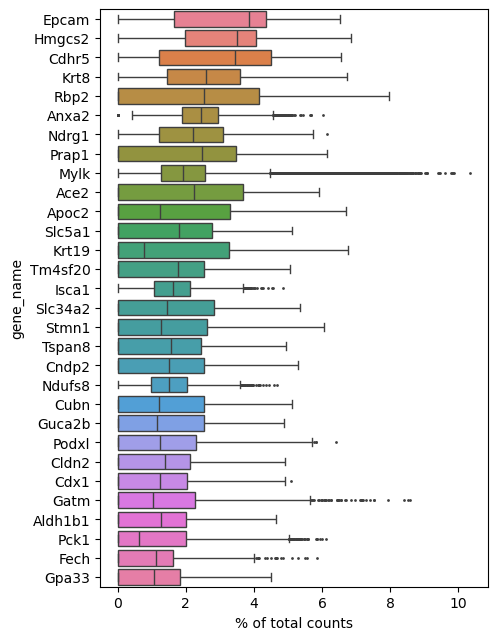

In [10]:
sc.pl.highest_expr_genes(adata, n_top=30)

# Velocity 

- 3 options for calculating velocity:
    - Deterministic 
    - Dynamic
    - Stochastic 

Information can be found [here](https://scvelo.readthedocs.io/en/stable/about.html).

In [11]:
import sys  
sys.path.insert(1,stvelo_path)
from pipelines.metrics import *
from pipelines.utils import proportions_nuc_cyto

# Cell Anotations

In [138]:
cell_types = {'0':'Epithelial',
'1':'Epithelial',
'2':'Epithelial',
'3':'Epithelial',
'4':'SMC',
'5':'Epithelial',
'6':'Endothelial',
'7':'Endothelial',
'8':'Endothelial',
'9':'Stromal',
'10':'Enteroendocrine',
'11':'Epithelial',
'12':'Pancreatic acinar',
'13':'Pancreatic b cells',
'14':'Hepatocyte'}

In [139]:
for k, adata in adata_dict.items():
    adata.obs['cell_type'] = adata.obs['leiden'].map(cell_types)

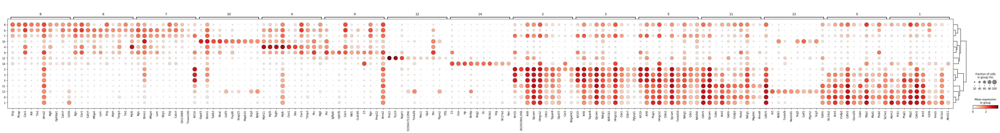

In [14]:
sc.tl.rank_genes_groups(adata_dict["adata_gut_deterministic"],groupby="leiden")
sc.tl.dendrogram(adata_dict['adata_gut_deterministic'],groupby='leiden')
sc.pl.rank_genes_groups_dotplot(adata_dict["adata_gut_deterministic"],groupby="leiden")

In [15]:
marker_dict = {}
for i in range(15):
    markers= list(sc.get.rank_genes_groups_df(adata_dict['adata_gut_deterministic'],group=str(i))['names'].head(5))
    marker_dict[i] = markers

In [146]:
adata_dict['adata_gut_dynamical'].var.velocity_genes.value_counts()

velocity_genes
True     255
False     82
Name: count, dtype: int64

In [16]:
marker_dict

{0: ['Slc34a2', 'Ace2', 'Cndp2', 'Cdhr5', 'Guca2b'],
 1: ['Apoc2', 'Pck1', 'Prap1', 'Rbp2', 'Cdhr5'],
 2: ['Krt19', '2610528A11Rik', 'Krt8', 'Epcam', 'Hmgcs2'],
 3: ['Krt19', 'Krt8', 'Tspan8', 'Epcam', 'Ndrg1'],
 4: ['Myh11', 'Myl9', 'Tagln', 'Mylk', 'Cnn1'],
 5: ['Krt19', 'Krt8', 'Prap1', 'Hmgcs2', 'Cldn2'],
 6: ['Bgn', 'Cav1', 'Calcrl', 'Mfap4', 'Lum'],
 7: ['Bgn', 'Stmn1', 'Mfap4', 'Lum', 'Sfrp1'],
 8: ['Eng', 'Plvap', 'Cav1', 'Kdr', 'Tie1'],
 9: ['Ptn', 'Igfbp6', 'Upk3b', 'Cav1', 'Nbl1'],
 10: ['Gap43', 'Stmn1', 'Tubb3', 'Nnat', 'Celf3'],
 11: ['Cdhr5', 'Epcam', 'Cubn', 'Ace2', 'Gatm'],
 12: ['Prss3', 'Try10', 'Nupr1', '5330417C22Rik', 'Tm4sf4'],
 13: ['Cdhr5', 'Sct', 'Aplp1', 'Tm4sf4', 'Neurod1'],
 14: ['C3', 'Uox', 'Hp', 'Ambp', 'Kng2']}

# Umaps 

In [73]:
import matplotlib.pyplot as plt

def plot_velocity_embedding_streams_nc(adata_dict, color_option='true_t'):
    """
    Plots velocity embedding streams for an AnnData dictionary containing only 'n_c' data,
    arranging the plots in a 2x2 grid with the velocity type as the title on each graph.

    Parameters:
    - adata_dict (dict): Dictionary with AnnData objects. Keys should follow the pattern 
                         'adata_n_c_800obs_300genes_{velocity_type}'.
    - color_option (str): Column name in AnnData.obs to color the plots. Default is 'true_t'.
    """
    # Create a figure with 2 rows and 2 columns of subplots
    fig, axes = plt.subplots(2, 2, figsize=(8, 8))  # Adjust figsize as needed

    # List of velocity types and corresponding labels
    velocity_types = ['deterministic', 'stochastic', 'dynamical', 'velovi']
    velocity_labels = ['Deterministic', 'Stochastic', 'Dynamical', 'VeloVI']

    # Flatten axes array for easy indexing
    axes_flat = axes.flatten()

    # Loop over each velocity type and plot the corresponding subplots
    for i, (velocity_type, velocity_label) in enumerate(zip(velocity_types, velocity_labels)):
        ax = axes_flat[i]
        # Plot for Cytoplasmic-Nucleic data
        adata_key_nc = f'adata_gut_{velocity_type}'
        if adata_key_nc in adata_dict:
            scv.pl.velocity_embedding_stream(
                adata_dict[adata_key_nc],
                basis='umap',
                color=color_option,
                ax=ax,
                show=False,
                legend_fontsize=10,
                title=velocity_label,
                 fontsize=15 # Set the velocity type as the title
            )
        else:
            # If the key is not in the dictionary, skip or handle appropriately
            print(f"Warning: {adata_key_nc} not found in adata_dict.")
            ax.set_visible(False)  # Hide the subplot if no data

        # Optionally, turn off x and y-axis labels to reduce clutter
        ax.set_xlabel('')
        ax.set_ylabel('')

    # Remove any unused subplots if adata_dict has fewer than 4 entries
    total_plots = len(velocity_types)
    if len(axes_flat) > total_plots:
        for i in range(total_plots, len(axes_flat)):
            axes_flat[i].set_visible(False)

    # Adjust layout to prevent overlap
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    # Add a main title for the entire figure
    fig.suptitle('', fontsize=1, y=0.995)

    # Show the plot
    plt.show()


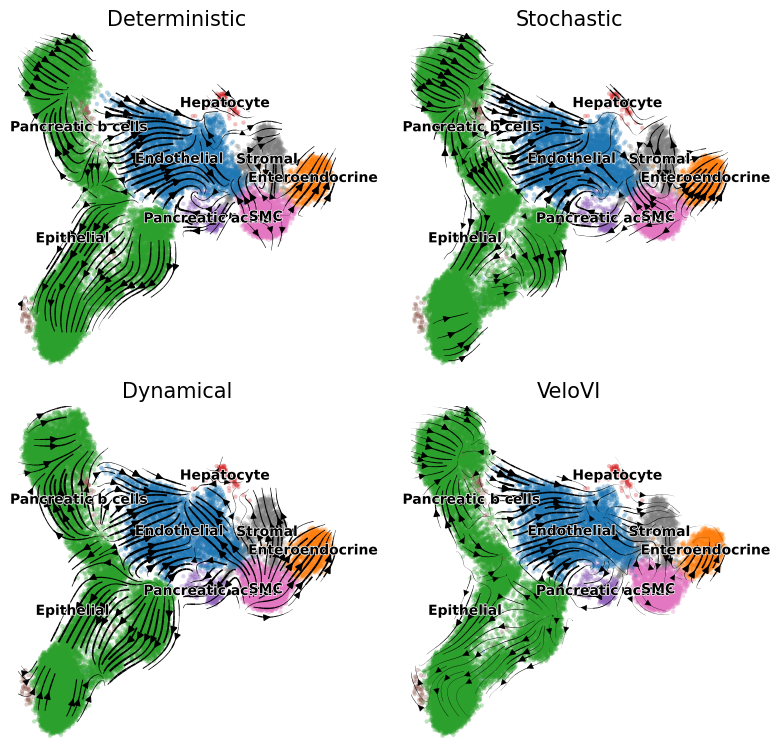

In [140]:
plot_velocity_embedding_streams_nc(adata_dict=adata_dict,color_option='cell_type')

# Marker genes Umap 

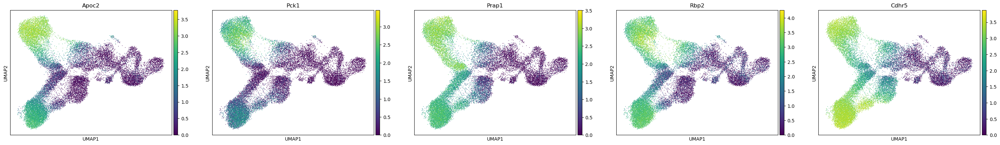

In [ ]:
# ['Apoc2', 'Pck1', 'Prap1', 'Rbp2', 'Cdhr5'] for cluster 1 

#

sc.pl.umap(adata_dict['adata_gut_deterministic'],color=['Apoc2', 'Pck1', 'Prap1', 'Rbp2', 'Cdhr5'],ncols=5, legend_fontsize='large')

# Velocity Confidence

In [133]:
import scvelo as scv
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_velocity_confidences(adatas):
    """
    Computes velocity confidences for each AnnData object in the dictionary and plots them using a violin plot.

    Parameters:
    - adatas (dict): Dictionary where keys are in the format 'adata_n_c_obs_genes_velocitytype',
                     and values are AnnData objects.

    The keys should follow this format:
    - 'adata_n_c_800obs_300genes_deterministic'
    """

    # Initialize an empty list to collect data for plotting
    plot_data = []

    # Loop through each AnnData object in the dictionary
    for key, adata in adatas.items():
        # Compute velocity confidence if not already computed
        if 'velocity_confidence' not in adata.obs:
            scv.tl.velocity_confidence(adata)

        # Extract velocity confidences from adata.obs
        velocity_confidence = adata.obs['velocity_confidence'].values

        # Parse the key to extract metadata
        # Key format: 'adata_n_c_800obs_300genes_deterministic'
        parts = key.split('_')

        # Extract velocity model type (e.g., 'deterministic', 'stochastic', etc.)
        velocity_type = parts[-1]

        # Map velocity_type to capitalized labels
        velocity_type_map = {
            'deterministic': 'Deterministic',
            'stochastic': 'Stochastic',
            'dynamical': 'Dynamical',
            'velovi': 'VeloVI'
        }
        velocity_type_label = velocity_type_map.get(velocity_type, velocity_type.capitalize())

        # Create a DataFrame for this adata
        df = pd.DataFrame({
            'velocity_confidence': velocity_confidence,
            'velocity_type': velocity_type,
            'velocity_type_label': velocity_type_label
        })

        # Append to the list
        plot_data.append(df)

    # Concatenate all DataFrames into one
    plot_df = pd.concat(plot_data, ignore_index=True)

    # Define the order of velocity types
    velocity_type_order = ['deterministic', 'stochastic', 'dynamical', 'velovi']
    # Corresponding labels
    velocity_type_labels = ['Deterministic', 'Stochastic', 'Dynamical', 'VeloVI']

    # Map velocity_type to categorical type with specified order
    plot_df['velocity_type'] = pd.Categorical(
        plot_df['velocity_type'],
        categories=velocity_type_order,
        ordered=True
    )
   

    # Set up the figure and axes
    fig, ax = plt.subplots(figsize=(12, 6))

    # Create a violin plot with nested grouping by velocity type and observation count
    sns.violinplot(
        x='velocity_type_label',
        y='velocity_confidence',
        data=plot_df,
        palette='Set2',
        order=velocity_type_labels,
        split=False,
        scale='width',
        inner='quartile',
        ax=ax
    )

    # Add vertical lines to separate velocity types
    x_positions = ax.get_xticks()
    for x in x_positions[1:]:
        ax.axvline(x=x - 0.5, color='gray', linestyle='--', linewidth=1)
        
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    plt.title('')
    plt.xlabel('')
    plt.ylabel('Velocity Confidence',fontsize=16)
    plt.tight_layout()
    plt.show()


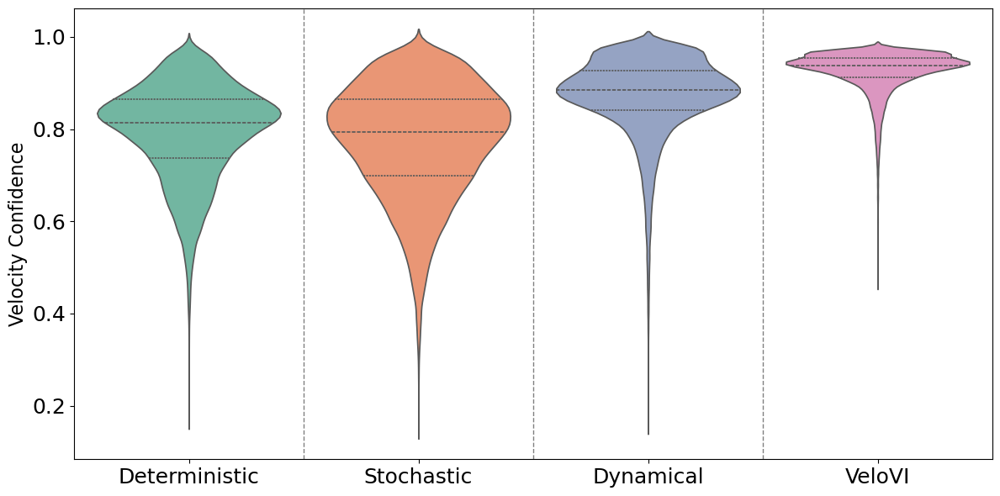

In [134]:
plot_velocity_confidences(adata_dict)

# Velocity Correlations 

In [37]:
import scvelo as scv
import pandas as pd
import numpy as np
from itertools import combinations

def compute_pairwise_mean_correlations(adatas, mode='by_gene'):
    """
    Computes all pairwise mean correlations between datasets in a dictionary of AnnData objects.

    Parameters:
    - adatas (dict): Dictionary where keys are dataset names (str) and values are AnnData objects.
    - mode (str): 
        - 'by_gene': Compute correlations by genes (correlate across cells for each gene).
        - 'by_cell': Compute correlations by cells (correlate across genes for each cell).

    Returns:
    - pd.DataFrame: A DataFrame with dataset names as both rows and columns, containing mean correlations.
    """
    
    # Validate mode
    if mode not in ['by_gene', 'by_cell']:
        raise ValueError("Invalid mode. Choose 'by_gene' or 'by_cell'.")
    
    # Get all dataset names
    dataset_names = list(adatas.keys())
    
    # Initialize an empty DataFrame to store mean correlations
    correlation_matrix = pd.DataFrame(index=dataset_names, columns=dataset_names, dtype=float)
    
    # Iterate over all unique pairs (including self-pairs)
    for ds1, ds2 in combinations(dataset_names, 2):
        adata1 = adatas[ds1]
        adata2 = adatas[ds2]
        
        # Find common genes
        common_genes = adata1.var_names.intersection(adata2.var_names)
        if len(common_genes) == 0:
            print(f"No common genes between '{ds1}' and '{ds2}'. Skipping.")
            mean_corr = np.nan
        else:
            # Subset velocity matrices to common genes
            velo1 = adata1.layers.get('velocity')
            velo2 = adata2.layers.get('velocity')
            
            if velo1 is None or velo2 is None:
                print(f"Velocity layer not found in '{ds1}' or '{ds2}'. Skipping.")
                mean_corr = np.nan
            else:
                # Convert to DataFrame for easier handling
                velo_df1 = pd.DataFrame(velo1, index=adata1.obs_names, columns=adata1.var_names)
                velo_df2 = pd.DataFrame(velo2, index=adata2.obs_names, columns=adata2.var_names)
                
                # Subset to common genes
                velo_df1 = velo_df1[common_genes]
                velo_df2 = velo_df2[common_genes]
                
                if mode == 'by_gene':
                    # Compute correlation across cells for each gene
                    gene_corrs = []
                    for gene in common_genes:
                        v1 = velo_df1[gene].values
                        v2 = velo_df2[gene].values
                        # Handle NaNs
                        mask = ~np.isnan(v1) & ~np.isnan(v2)
                        if np.sum(mask) > 0:
                            corr = np.corrcoef(v1[mask], v2[mask])[0, 1]
                            gene_corrs.append(corr)
                    # Compute mean correlation, ignoring NaNs
                    if gene_corrs:
                        mean_corr = np.nanmean(gene_corrs)
                    else:
                        mean_corr = np.nan
                        
                elif mode == 'by_cell':
                    # Find common cells
                    common_cells = adata1.obs_names.intersection(adata2.obs_names)
                    if len(common_cells) == 0:
                        print(f"No common cells between '{ds1}' and '{ds2}'. Skipping.")
                        mean_corr = np.nan
                    else:
                        # Subset velocity matrices to common cells
                        velo_df1 = velo_df1.loc[common_cells]
                        velo_df2 = velo_df2.loc[common_cells]
                        
                        # Compute correlation across genes for each cell
                        cell_corrs = []
                        for cell in common_cells:
                            v1 = velo_df1.loc[cell].values
                            v2 = velo_df2.loc[cell].values
                            # Handle NaNs
                            mask = ~np.isnan(v1) & ~np.isnan(v2)
                            if np.sum(mask) > 0:
                                corr = np.corrcoef(v1[mask], v2[mask])[0, 1]
                                cell_corrs.append(corr)
                        # Compute mean correlation, ignoring NaNs
                        if cell_corrs:
                            mean_corr = np.nanmean(cell_corrs)
                        else:
                            mean_corr = np.nan
                        
        # Assign the mean correlation to both (ds1, ds2) and (ds2, ds1)
        correlation_matrix.at[ds1, ds2] = mean_corr
        correlation_matrix.at[ds2, ds1] = mean_corr
    
    # Fill diagonal with 1.0 (correlation of a dataset with itself)
    np.fill_diagonal(correlation_matrix.values, 1.0)
    
    return correlation_matrix


In [57]:
cor_gene = compute_pairwise_mean_correlations(adatas)
cor_cell = compute_pairwise_mean_correlations(adatas, mode='by_cell')

In [58]:
name_mapping = {}

# Define data type mapping
data_type_map = {
    'deterministic': 'Deterministic',
    'stochastic': 'Stochastic',
    'dynamical' : 'Dynamical',
    'velovi': 'VeloVI'
}

# Loop over each name in the index (and columns)
for name in cor_gene.index:
    parts = name.split('_')
    # Extract data type (e.g., 'n_c' or 's_u')
    data_type =  parts[2]
    data_type_label = data_type_map.get(data_type, data_type)
    
    # Combine to form the new label
    new_label = f"{data_type_label}"
    
    # Add to the mapping
    name_mapping[name] = new_label

In [59]:
# Rename the index and columns using the mapping
corr_by_gene = cor_gene.rename(index=name_mapping, columns=name_mapping)
corr_by_cell = cor_cell.rename(index=name_mapping, columns=name_mapping)

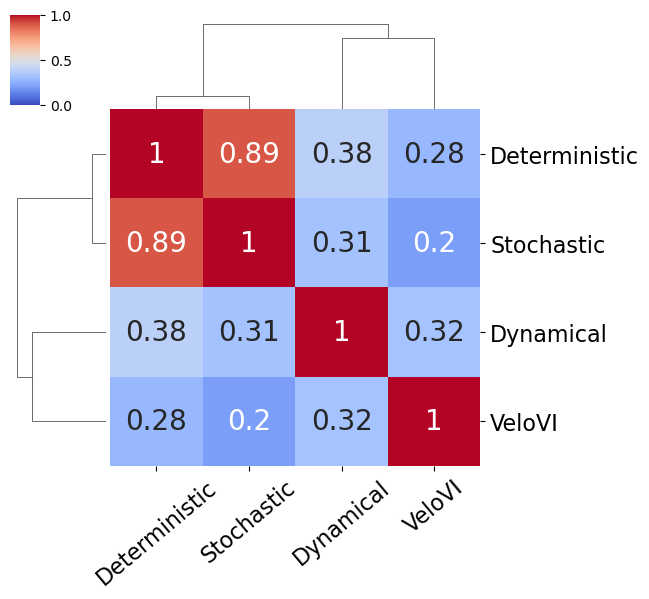

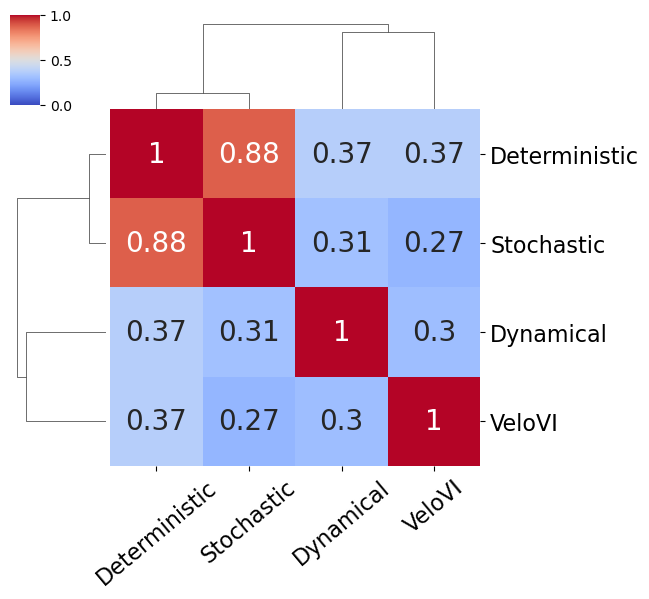

In [62]:
clustermap_cell = sns.clustermap(corr_by_gene, cmap='coolwarm', annot=True, figsize=(6, 5), vmin=0, vmax=1,annot_kws={"size":20})

# Modify tick labels for the cell clustermap
clustermap_cell.ax_heatmap.set_xticklabels(
    clustermap_cell.ax_heatmap.get_xticklabels(),
    rotation=40,  # Tilt the labels by 45 degrees
    fontsize=16   # Increase font size
)
clustermap_cell.ax_heatmap.set_yticklabels(
    clustermap_cell.ax_heatmap.get_yticklabels(),
    rotation=0,
    fontsize=16   # Increase font size
)

# Clustermap for correlation by gene
clustermap_gene = sns.clustermap(corr_by_cell, cmap='coolwarm', annot=True, figsize=(6, 5), vmin=0, vmax=1,annot_kws={"size":20})

# Modify tick labels for the gene clustermap
clustermap_gene.ax_heatmap.set_xticklabels(
    clustermap_gene.ax_heatmap.get_xticklabels(),
    rotation=40,  # Tilt the labels by 45 degrees
    fontsize=16   # Increase font size
)
clustermap_gene.ax_heatmap.set_yticklabels(
    clustermap_gene.ax_heatmap.get_yticklabels(),
    fontsize=16,
    rotation=0,# Increase font size
)

plt.show()

# Deterministic Velocity

<Axes: >

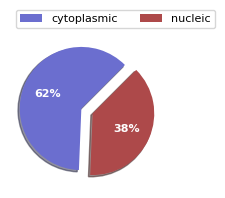

In [63]:
proportions_nuc_cyto(adata_dict['adata_gut_deterministic'],fontsize=8)

In [114]:
for k, adata in adata_dict.items():
    print(k)
    scv.pl.velocity_embedding_stream(adata, basis='umap', color='leiden')

computing velocity embedding
    finished (0:00:07) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


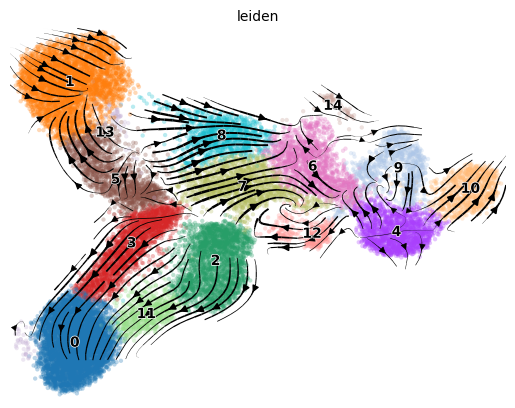

In [66]:
scv.pl.velocity_embedding_stream(adata_dict['adata_gut_deterministic'],basis='umap', color = 'leiden')

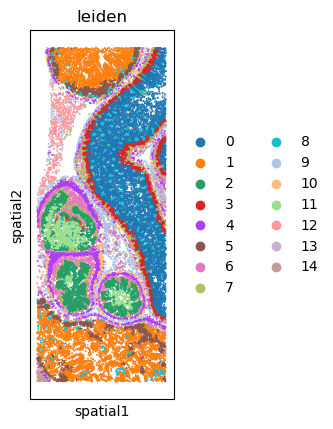

In [ ]:
sc.pl.spatial(adata_dict['adata_gut_deterministic'], color="leiden", spot_size = 20)

In [137]:
marker_dict

{0: ['Slc34a2', 'Ace2', 'Cndp2', 'Cdhr5', 'Guca2b'],
 1: ['Apoc2', 'Pck1', 'Prap1', 'Rbp2', 'Cdhr5'],
 2: ['Krt19', '2610528A11Rik', 'Krt8', 'Epcam', 'Hmgcs2'],
 3: ['Krt19', 'Krt8', 'Tspan8', 'Epcam', 'Ndrg1'],
 4: ['Myh11', 'Myl9', 'Tagln', 'Mylk', 'Cnn1'],
 5: ['Krt19', 'Krt8', 'Prap1', 'Hmgcs2', 'Cldn2'],
 6: ['Bgn', 'Cav1', 'Calcrl', 'Mfap4', 'Lum'],
 7: ['Bgn', 'Stmn1', 'Mfap4', 'Lum', 'Sfrp1'],
 8: ['Eng', 'Plvap', 'Cav1', 'Kdr', 'Tie1'],
 9: ['Ptn', 'Igfbp6', 'Upk3b', 'Cav1', 'Nbl1'],
 10: ['Gap43', 'Stmn1', 'Tubb3', 'Nnat', 'Celf3'],
 11: ['Cdhr5', 'Epcam', 'Cubn', 'Ace2', 'Gatm'],
 12: ['Prss3', 'Try10', 'Nupr1', '5330417C22Rik', 'Tm4sf4'],
 13: ['Cdhr5', 'Sct', 'Aplp1', 'Tm4sf4', 'Neurod1'],
 14: ['C3', 'Uox', 'Hp', 'Ambp', 'Kng2']}

In [75]:
adata= adata_dict['adata_gut_deterministic']

In [141]:
clusters_of_interest = ["Epithelial"]
adata_filtered = adata[adata.obs['cell_type'].isin(clusters_of_interest)]

In [142]:
adata_filtered

View of AnnData object with n_obs × n_vars = 16348 × 300
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_counts', 'leiden', 'velocity_self_transition', 'cell_type', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition'
    var: 'Ensemble ID', 'feature_types', 'genome', 'n_cells', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'velocity_graph', 'velocity_graph_neg', 'velocity_params', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap', 'spatial', 'velocity_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'fit_t', 'latent_time_velovi', 'spliced', 'unspliced', 'velocity'
    obsp: 'connectivities', 'distances'

In [ ]:
#adata_filtered.obs['leiden'].value_counts()

leiden
0     5277
1     4074
2     2457
3     2148
5     1642
11     750
14      66
Name: count, dtype: int64

In [ ]:
#adata_filtered.write("data/Xenium_V1_mouse_pup_outs/adata_filtered_epithelial.h5ad")

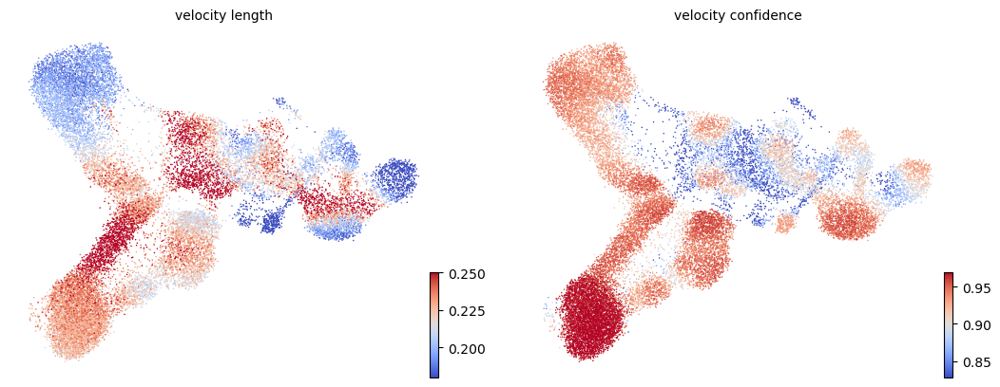

In [144]:
# scv.tl.velocity_confidence(adata_dict['adata_gut_velovi'])
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_dict['adata_gut_velovi'], c=keys, cmap='coolwarm', perc=[5, 95])

In [146]:
for k, adata in adata_dict.items():
    scv.tl.velocity_confidence(adata)


--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)
--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)
--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)
--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)


In [147]:
df = adata_dict['adata_gut_deterministic'].obs.groupby('leiden')[["velocity_length","velocity_confidence"]].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
velocity_length,1.436470,1.966242,1.579027,1.758520,1.229336,1.701602,2.412656,5.518880,5.374129,2.113202,2.275973,1.600240,3.460189,2.376729,2.280454
velocity_confidence,0.833514,0.806960,0.761557,0.803230,0.653027,0.785971,0.772633,0.833255,0.862979,0.753392,0.806957,0.828607,0.819954,0.657357,0.499228


In [ ]:
adata_dict['']

# Cell Transitions 

In [88]:
for k, v in adata_dict.items():
    adata.obs.reset_index(inplace=True,drop=True)

In [90]:
adata = adata_dict['adata_gut_deterministic']

In [91]:
df = adata.obs

In [100]:
df[df['leiden']== '3'].sort_values('velocity_self_transition').tail(10)

,cell_id,x_centroid,y_centroid,transcript_counts,total_counts,cell_area,nucleus_area,n_counts,leiden,velocity_self_transition,cell_type
14301,jeeioand-1,5457.415527,6300.788086,216,216,70.398596,33.551095,70.638336,3,0.707725,Epithelial
22578,ljfehpph-1,5846.859375,4691.034180,185,185,50.439533,31.654532,77.325668,3,0.711104,Epithelial
10527,icjagcpg-1,5147.410645,5606.300781,108,108,48.678439,17.746407,66.671272,3,0.712204,Epithelial
7259,hbbcbede-1,5614.501465,4983.535645,145,145,44.749845,11.018125,68.464127,3,0.717801,Epithelial
14330,jeekknkp-1,5501.740723,6342.311523,137,137,38.337658,30.932032,76.041420,3,0.717933,Epithelial
16110,jeopkckh-1,5197.079102,5972.854492,181,181,50.891096,34.183282,71.257591,3,0.721183,Epithelial
10861,ickdfnpg-1,5652.896973,5574.898926,279,279,84.893753,33.912345,80.434799,3,0.726465,Epithelial
22422,ljdaommb-1,5807.429688,4757.161133,169,169,79.113753,43.937033,73.563232,3,0.739688,Epithelial
24354,obpamjjn-1,5856.896484,6073.153320,320,320,107.471879,49.897658,74.829567,3,0.757460,Epithelial
14926,jehonnne-1,5286.972168,6108.983887,116,116,38.653751,33.867189,72.181076,3,0.795825,Epithelial


adata_gut_deterministic


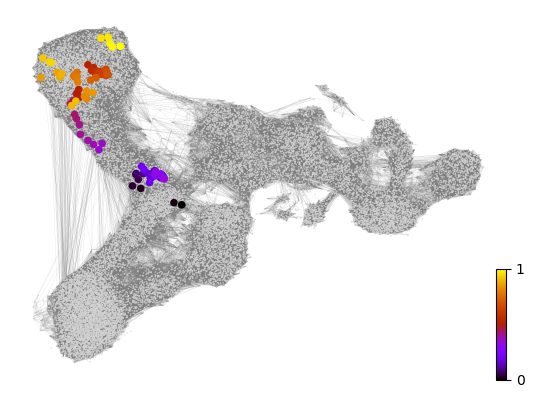

adata_gut_dynamical


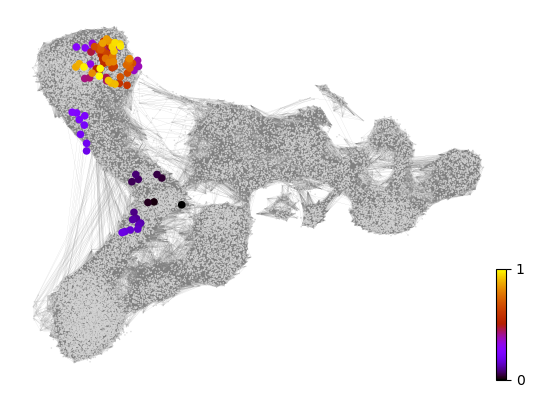

adata_gut_stochastic


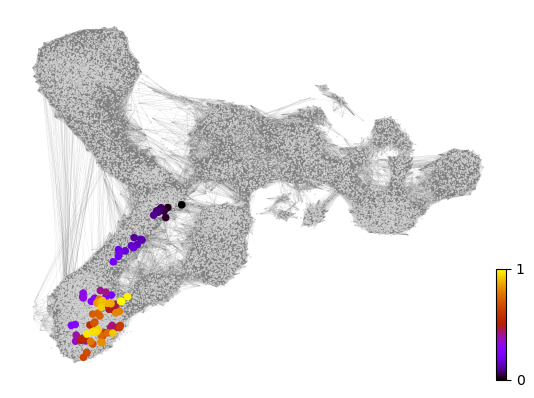

adata_gut_velovi


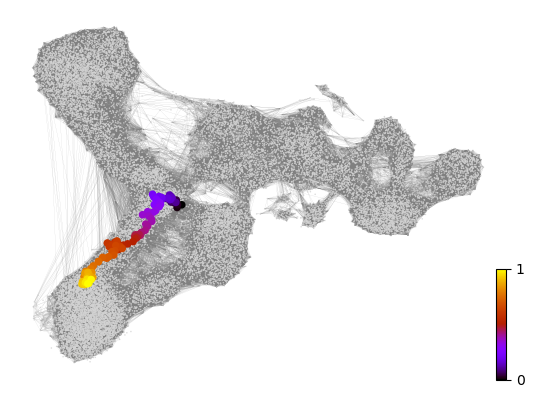

In [ ]:
for k, adata in adata_dict.items():
    print(k)
    x, y = scv.utils.get_cell_transitions(adata_dict[k], basis='umap', starting_cell=14301)
    ax = scv.pl.velocity_graph(adata_dict[k], c='lightgrey', edge_width=.05, show=False)
    ax = scv.pl.scatter(adata_dict[k], x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

adata_gut_deterministic


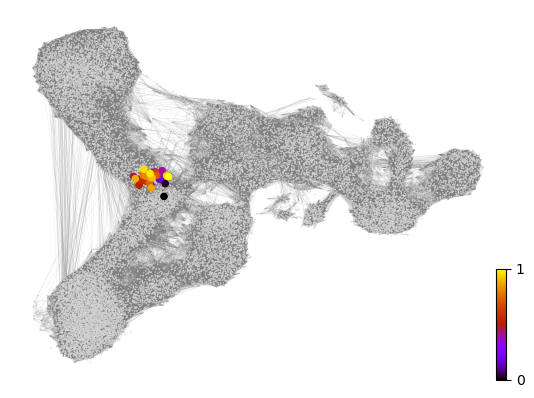

adata_gut_dynamical


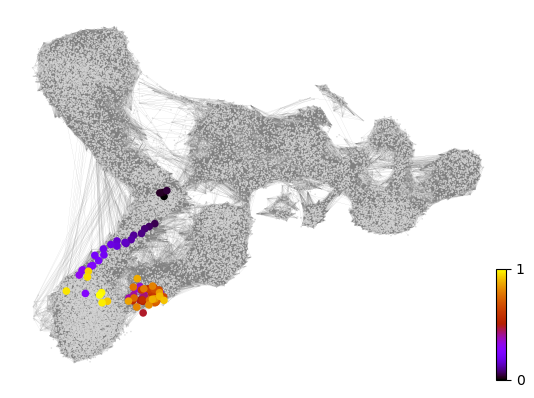

adata_gut_stochastic


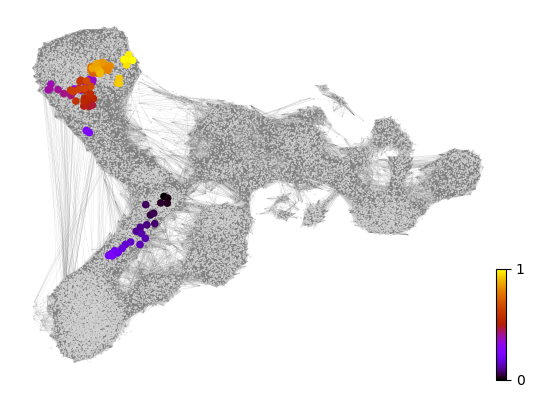

adata_gut_velovi


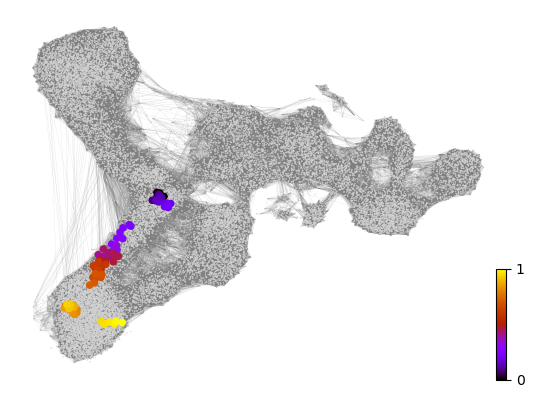

In [101]:
for k, adata in adata_dict.items():
    print(k)
    x, y = scv.utils.get_cell_transitions(adata_dict[k], basis='umap', starting_cell=14301)
    ax = scv.pl.velocity_graph(adata_dict[k], c='lightgrey', edge_width=.05, show=False)
    ax = scv.pl.scatter(adata_dict[k], x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

## Leiden 2

In [107]:
df[df['leiden']== '2'].sort_values('velocity_self_transition').head(100)

,cell_id,x_centroid,y_centroid,transcript_counts,total_counts,cell_area,nucleus_area,n_counts,leiden,velocity_self_transition,cell_type
18501,kfgffapb-1,5530.763672,7253.440430,149,149,58.928908,33.551095,62.406517,2,0.107127,Epithelial
17610,kfcdoagb-1,5661.636230,7228.927246,165,165,53.284377,36.215314,61.457237,2,0.124759,Epithelial
17826,kfdfbofc-1,5648.642090,7069.790527,173,173,71.888753,17.069063,65.896820,2,0.125239,Epithelial
17711,kfcmedhd-1,5655.390137,7221.540527,133,133,68.502034,22.397501,55.658688,2,0.134741,Epithelial
18541,kfgjnhoa-1,5534.573730,7261.382324,117,117,42.130783,25.784220,64.278244,2,0.135013,Epithelial
...,...,...,...,...,...,...,...,...,...,...,...
17819,kfdejbal-1,5646.376465,7053.683105,132,132,42.762970,29.667657,61.096054,2,0.265460,Epithelial
18489,kfgdfljd-1,5421.552734,7269.143066,153,153,64.437971,34.409064,71.748238,2,0.265976,Epithelial
19853,kfnlbhoj-1,5555.608398,7036.212891,223,223,122.463754,50.123439,66.757698,2,0.267240,Epithelial
17709,kfcmccee-1,5667.058594,7221.526367,129,129,39.195626,24.113438,67.548996,2,0.267447,Epithelial


adata_gut_deterministic


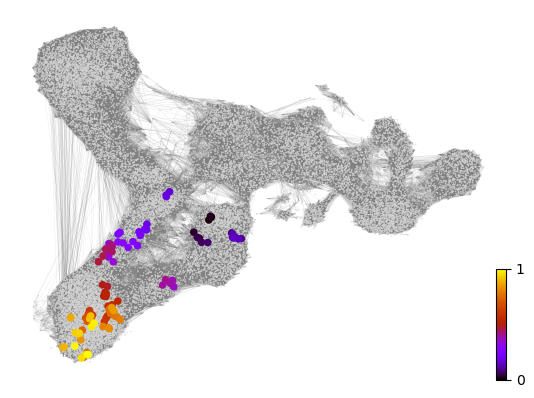

adata_gut_dynamical


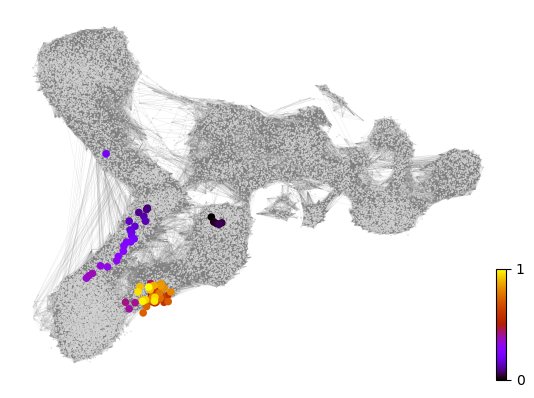

adata_gut_stochastic


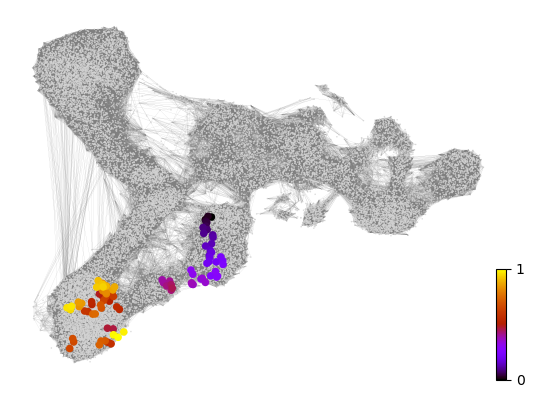

adata_gut_velovi


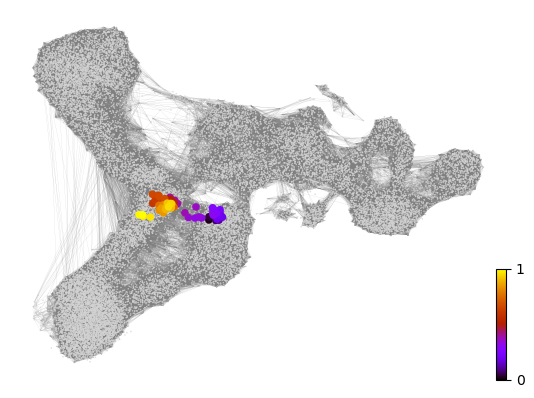

In [108]:
for k, adata in adata_dict.items():
    print(k)
    x, y = scv.utils.get_cell_transitions(adata_dict[k], basis='umap', starting_cell=20188)
    ax = scv.pl.velocity_graph(adata_dict[k], c='lightgrey', edge_width=.05, show=False)
    ax = scv.pl.scatter(adata_dict[k], x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

adata_gut_deterministic


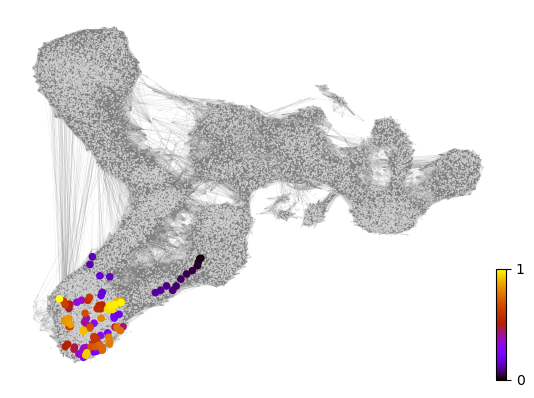

adata_gut_dynamical


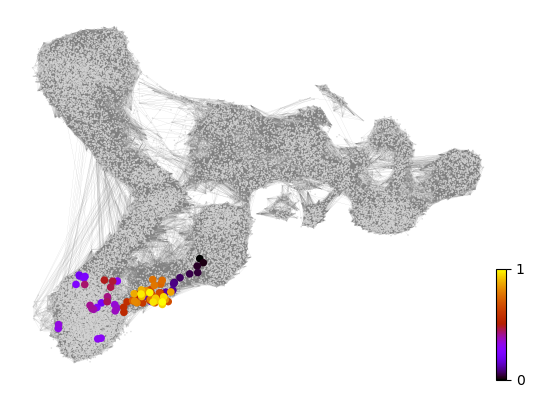

adata_gut_stochastic


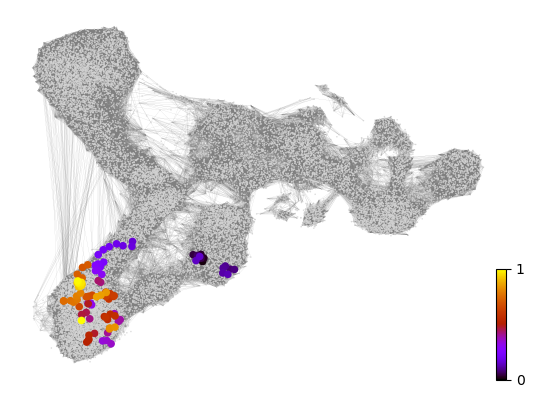

adata_gut_velovi


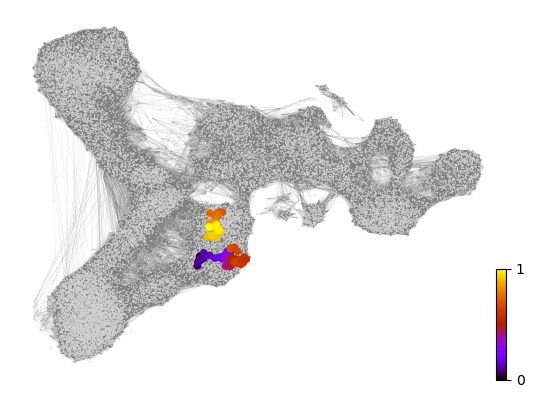

In [106]:
for k, adata in adata_dict.items():
    print(k)
    x, y = scv.utils.get_cell_transitions(adata_dict[k], basis='umap', starting_cell=19797)
    ax = scv.pl.velocity_graph(adata_dict[k], c='lightgrey', edge_width=.05, show=False)
    ax = scv.pl.scatter(adata_dict[k], x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

# Paga

In [46]:
# this is needed due to a current bug - bugfix is coming soon.
adata_dict['adata_gut_deterministic'].uns['neighbors']['distances'] = adata_dict['adata_gut_deterministic'].obsp['distances']
adata_dict['adata_gut_deterministic'].uns['neighbors']['connectivities'] = adata_dict['adata_gut_deterministic'].obsp['connectivities']

scv.tl.paga(adata_dict['adata_gut_deterministic'], groups='leiden')
df = scv.get_df(adata_dict['adata_gut_deterministic'], 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:15) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0,4.6,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,nan,0,0,0,0,nan,0,0,0,0,0,6.1,0,0,0
3,nan,0,0,0,0,nan,0,0,0,0,0,17,0,0,0
4,0,0,0,0,0,0,0,0,0,0,nan,0,0,0,0
5,nan,14,0,0,0,0,0,0,0,0,0,0,0,nan,0
6,nan,0,0,nan,13,0,0,0,0,1.7,0,0,0,0,0
7,0,nan,0,1.4,1.5,nan,nan,0,nan,0,nan,nan,nan,0,nan
8,nan,nan,0,0,0,0,7.8,0,0,nan,nan,0,0,0,0
9,0,0,0,0,nan,nan,0,0,0,0,0.64,0,1.3,0,0


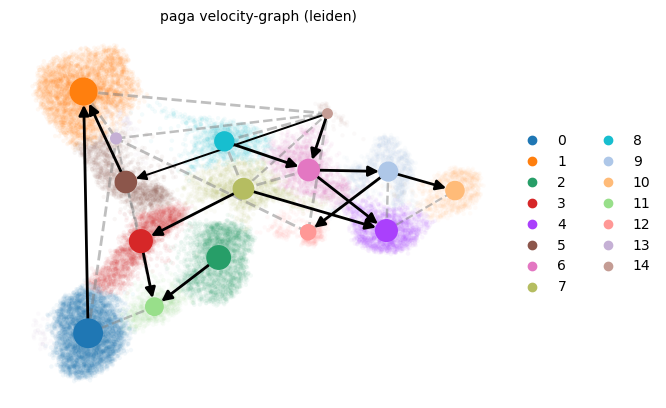

In [48]:
scv.pl.paga(adata_dict['adata_gut_deterministic'], basis='umap', size=40, alpha=.05,
            min_edge_width=0.5, node_size_scale=1.5)

In [28]:
transition_matrix = scv.utils.get_transition_matrix(adata)

In [29]:
transition_matrix

<3696x3696 sparse matrix of type '<class 'numpy.float32'>'
	with 681987 stored elements in Compressed Sparse Row format>

# Velocity Genes

In [26]:
scv.tl.rank_velocity_genes(adata_dict['adata_gut_deterministic'], groupby='leiden', min_corr=.3)

df = scv.get_df(adata_dict['adata_gut_deterministic'].uns['rank_velocity_genes']['names'])
df.head(6)

ranking velocity genes
    finished (0:00:02) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,19,266,17,273,275,269,275,41,53,133,300,19,300,301,51
1,0,106,66,327,56,124,294,231,47,275,329,0,336,302,163
2,285,177,80,199,21,327,77,126,21,294,15,199,145,23,232
3,11,351,328,269,268,287,167,263,349,308,105,78,79,303,133
4,324,305,214,19,105,330,240,230,264,226,77,66,354,352,178
5,188,201,260,11,77,155,244,212,61,316,240,344,215,68,283


In [27]:
import warnings

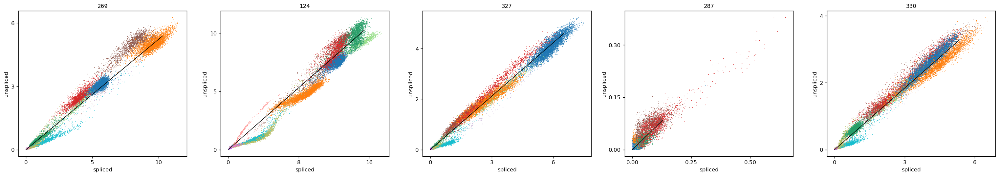

In [34]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    scv.pl.scatter(adata_dict['adata_gut_deterministic'], df['5'][0:5],color="leiden",dpi=120)

## Dynamic Velocity 

computing velocity embedding
    finished (0:00:09) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


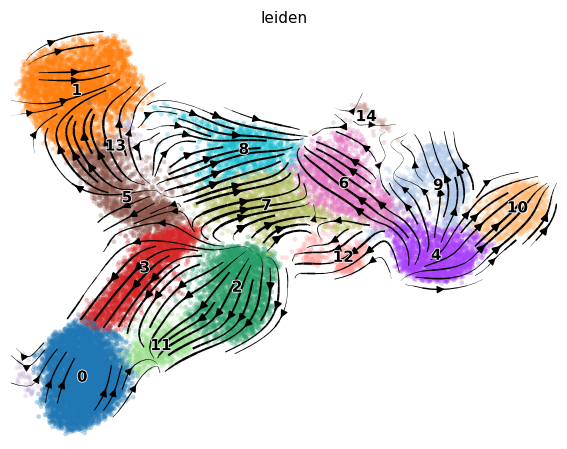

In [49]:
import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    scv.pl.velocity_embedding_stream(adata_dict['adata_gut_dynamical'], basis='umap',color="leiden", dpi=110)
    # scv.pl.velocity_embedding_stream(adata, basis='spatial',color="leiden")

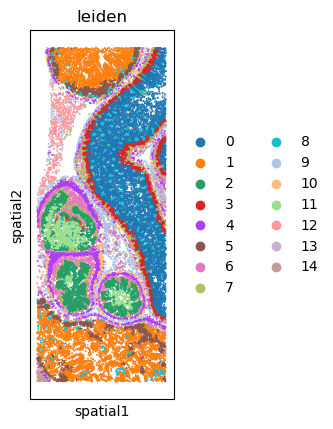

In [50]:
sc.pl.spatial(adata_dict['adata_gut_deterministic'], color="leiden", spot_size = 20)

In [75]:
adata = adata_dict['adata_gut_dynamical']

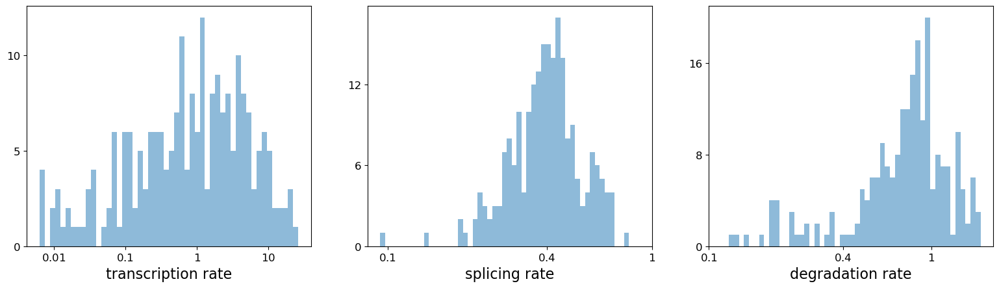

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
0,0.64,0.12,0.41,0.54,9.77,1.97,0.11,0.05,0.29,0.0,0.0,8.94e-04,0.24,0.13,0.67,1.25
2,0.99,9.40,1.74,1.04,5.32,0.27,1.14,1.99,0.39,0.0,0.0,4.98e-01,5.10,8.69,0.30,0.95
3,0.79,0.74,0.72,0.88,4.85,0.57,0.14,0.11,0.08,0.0,0.0,4.87e-01,1.25,0.47,2.04,1.04
4,0.96,1.48,1.96,1.20,8.13,0.29,0.19,0.31,0.42,0.0,0.0,4.92e-01,0.50,1.16,0.26,0.79
5,0.87,0.27,0.20,0.66,6.34,1.99,0.31,0.07,0.25,0.0,0.0,4.46e-01,0.85,0.24,0.65,1.07


In [54]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]
kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

In [55]:
df_fit_gut = scv.get_df(adata, 'fit*', dropna=True)

In [56]:
df_fit_gut.reset_index(inplace=True,drop=True)

In [17]:
df_fit_gut.to_csv('data/Xenium_V1_mouse_pup_outs/df_fit_gut.csv')

### latent time 

computing terminal states
    identified 8 regions of root cells and 2 regions of end points .
    finished (0:00:11) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:09) --> added 
    'latent_time', shared time (adata.obs)


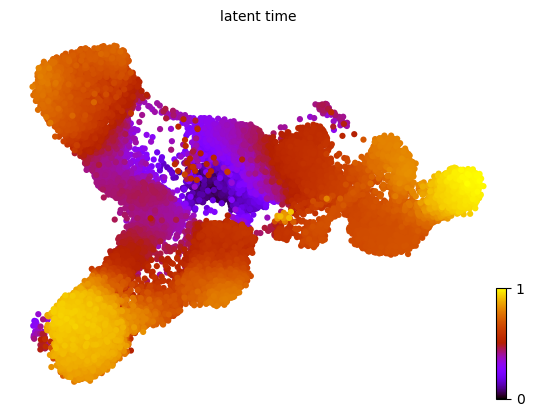

In [57]:
scv.tl.latent_time(adata)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)

In [45]:
adata.var.set_index("gene_name",drop=True,inplace=True)

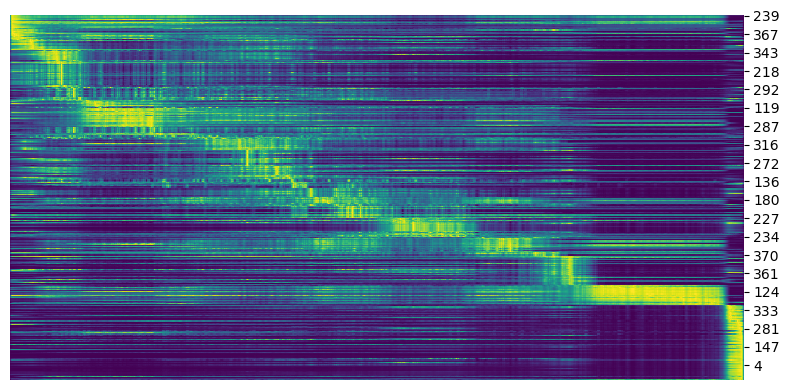

In [58]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time',  n_convolve=100)

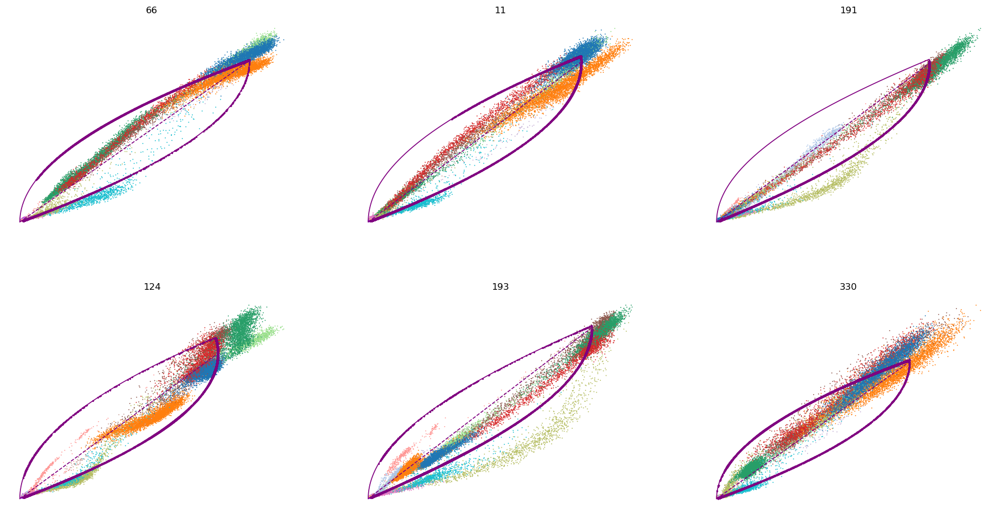

In [59]:
import warnings

top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    scv.pl.scatter(adata,color="leiden", basis=top_genes[:6], ncols=3, frameon=False,dpi=120)

In [66]:
scv.tl.rank_dynamical_genes(adata, groupby='leiden')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:08) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,Cdhr5,Cdhr5,Krt8,Krt8,Mgll,Krt19,Sdc1,Krt19,Rbp2,Isca1,Isca1,Cndp2,Krt8,Ace2,Hmgcs2
1,Epcam,Apoc2,Krt19,Krt19,Myl9,Krt8,Isca1,Stmn1,Ndrg1,Cav1,Mylk,Ace2,Epcam,Slc34a2,Krt8
2,Ace2,Cldn2,Tspan8,Epcam,Timp3,Epcam,Stmn1,Isca1,Timp3,Timp3,Timp3,Cldn2,Cldn3,Cldn2,Ace2
3,Cubn,Ace2,Cubn,Cubn,Myh11,Isca1,Myl9,Timp3,Cav1,Sdc1,Slc4a4,Tm4sf20,Anxa2,Epcam,Mylk3
4,Krt8,Cubn,Isca1,Isca1,Tagln,Anxa2,Anxa2,Mgll,Hmgcs2,Stmn1,Ndufs8,Tspan8,Hpgd,Tspan8,Tm4sf20


In [65]:
adata.var.set_index('gene_name',drop=True,inplace=True)

In [ ]:
for cluster in ['2610528A11Rik', 'Krt8', 'Mgll', 'Cndp2']:
    scv.pl.scatter(adata, df[cluster][:5], ylabel=cluster, frameon=False,color='leiden')

In [79]:
var_names = ['Cdhr5', 'Epcam', 'Cndp2', 'Krt8']
scv.tl.differential_kinetic_test(adata, var_names=var_names, groupby='leiden')

testing for differential kinetics
    finished (0:00:07) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)

outputs model fit of gene: Krt8


In [80]:
scv.get_df(adata[:, var_names], ['fit_diff_kinetics', 'fit_pval_kinetics'], precision=2)

,fit_diff_kinetics,fit_pval_kinetics
gene_name,,
Cdhr5,"2,3,5,11",2.43e-08
Epcam,"1,11",5.38e-13
Cndp2,"0,1",2.52e-04
Krt8,7,6.67e-04


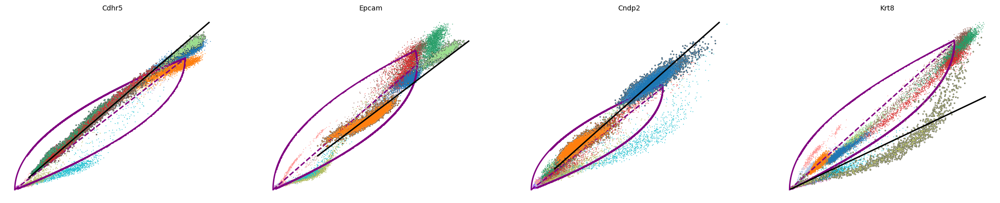

In [81]:
kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
scv.pl.scatter(adata, basis=var_names, add_outline='fit_diff_kinetics', **kwargs)

In [ ]:
scv.get_df(adata[:, var_names], ['fit_diff_kinetics', 'fit_pval_kinetics'], precision=2)

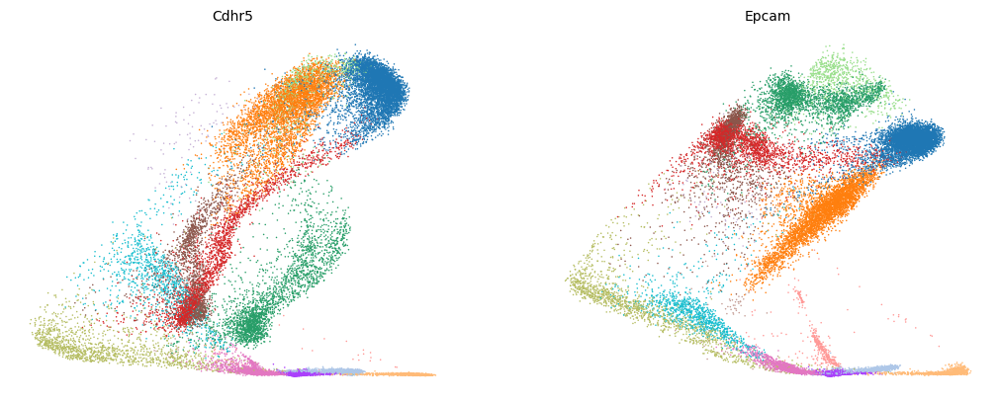

In [ ]:
var_names = ['Cdhr5', 'Epcam']
#scv.pl.scatter(adata, var_names, frameon=False)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    scv.pl.scatter(adata, x='latent_time', y=var_names,color="leiden", frameon=False,add_outline=)


In [125]:
scv.tl.rank_dynamical_genes(adata, groupby='leiden')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:00) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


/var/folders/n1/3rys77050fl0ptsh50jc4t_40000gn/T/ipykernel_1652/3630236659.py:2: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  df = scv.get_df(adata, 'rank_dynamical_genes/names')
/opt/anaconda3/envs/scvelo/lib/python3.12/site-packages/scvelo/core/_anndata.py:257: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if is_categorical_dtype(data.obs[key])


,0,1,2,3,4,5,6
0,Cdhr5,Cdhr5,Rbp2,Epcam,Cnn1,Try10,Ace2
1,Epcam,Krt19,Hmgcs2,Ace2,Tagln,Prss3,Epcam
2,Apoc2,Krt8,Ndrg1,Cdhr5,Myh11,Dpt,Guca2b
3,Prap1,Prap1,Eng,Rbp2,Myl9,Ptprn2,Apoc2
4,Guca2b,Ace2,Tie1,Guca2b,Mylk,Tmem147,Rbp2


### Identify important genes 

In [59]:
scv.tl.rank_velocity_genes(adata, groupby='leiden', min_corr=.3)

df = scv.get_df(adata.uns['rank_velocity_genes']['names'])
df.head(6)

ranking velocity genes


c:\Users\OmerCagatayTalikaci\anaconda3\envs\scvi-env\lib\site-packages\scvelo\tools\utils.py:463: DeprecationWarning: Please import `rankdata` from the `scipy.stats` namespace; the `scipy.stats.stats` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.stats.stats import rankdata


    finished (0:00:02) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,136,136,17,47,275,273,106,244,275,329,133,70,352,246
1,0,266,328,349,308,77,327,308,299,300,359,295,301,3
2,266,351,66,215,124,26,66,363,294,91,5,43,126,145
3,84,67,67,41,363,269,11,124,133,308,241,84,302,58
4,67,0,80,149,56,124,269,21,308,124,299,91,303,255
5,338,255,239,53,105,363,199,241,240,363,244,103,3,295


In [61]:
import warnings

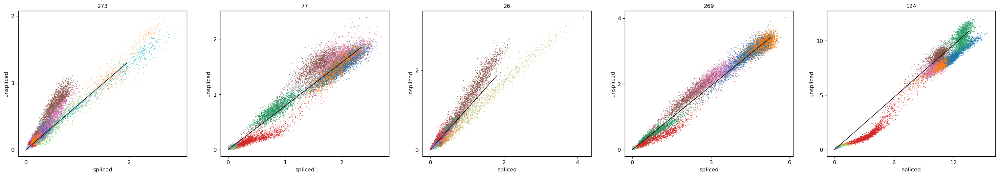

In [75]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    scv.pl.scatter(adata, df['5'][0:5],color="leiden",dpi=120)

# Velocities in cycling progenitors

- cell cycle genes information is required.


In [68]:
adata.var.index

Index(['0610005C13Rik', '1110017D15Rik', '2610528A11Rik', '5330417C22Rik',
       '6330403K07Rik', 'A330076H08Rik', 'AU021092', 'Aadat', 'Abca13',
       'Abcb11',
       ...
       'Uox', 'Upk1a', 'Upk1b', 'Upk3a', 'Upk3b', 'Vsnl1', 'Vsx2', 'Vwf',
       'Wif1', 'Wnt3'],
      dtype='object', name='gene_name', length=374)

In [ ]:
scv.tl.score_genes_cell_cycle(adata)
scv.pl.scatter(adata, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])


# Speed and Coherence

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


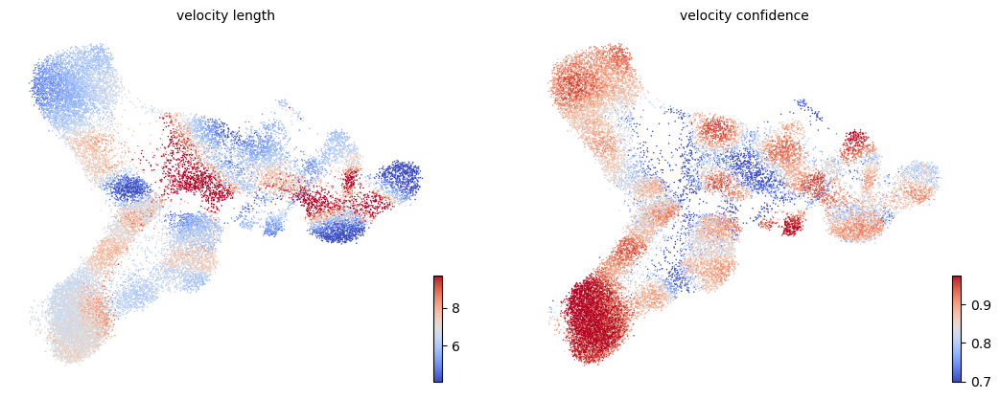

In [83]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

In [84]:
adata.obs.groupby('leiden')[["velocity_length","velocity_confidence"]].mean().T

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
velocity_length,6.81,5.73,6.27,7.14,6.29,6.12,6.48,8.86,6.75,6.75,5.09,6.18,5.30,6.47,6.27
velocity_confidence,0.95,0.89,0.84,0.87,0.85,0.83,0.87,0.74,0.84,0.86,0.84,0.84,0.87,0.79,0.60


In [85]:

df = adata.obs.groupby('leiden')[["velocity_length","velocity_confidence"]].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
velocity_length,6.814715,5.731622,6.272674,7.139106,6.292396,6.123721,6.477759,8.858901,6.753549,6.746325,5.091176,6.184453,5.302264,6.473178,6.265303
velocity_confidence,0.946071,0.888936,0.835387,0.867829,0.853497,0.832333,0.865113,0.741386,0.844985,0.863358,0.844786,0.841163,0.874776,0.794021,0.601721


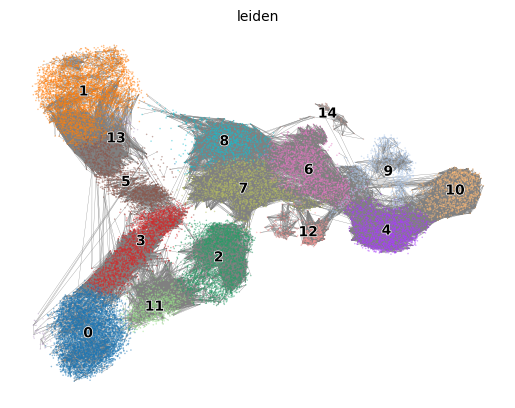

In [90]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    scv.pl.velocity_graph(adata, threshold=.6,color="leiden",alpha=0.5,)

In [92]:
adata.obs.iloc[20000]

cell_id                           kfohhhld-1
x_centroid                           5113.72
y_centroid                           7004.77
transcript_counts                        136
total_counts                             136
cell_area                              39.38
nucleus_area                            9.89
n_counts                                61.8
leiden                                     2
velocity_self_transition                0.47
root_cells                              0.07
end_points                               0.0
velocity_pseudotime                     0.34
latent_time                             0.53
velocity_length                         8.14
velocity_confidence                      0.8
velocity_confidence_transition           0.3
Name: 966086, dtype: object

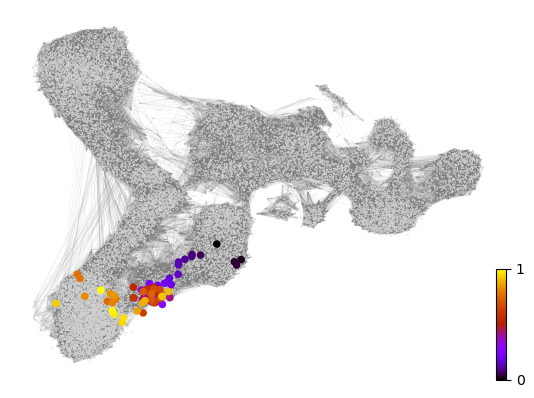

In [87]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=600)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

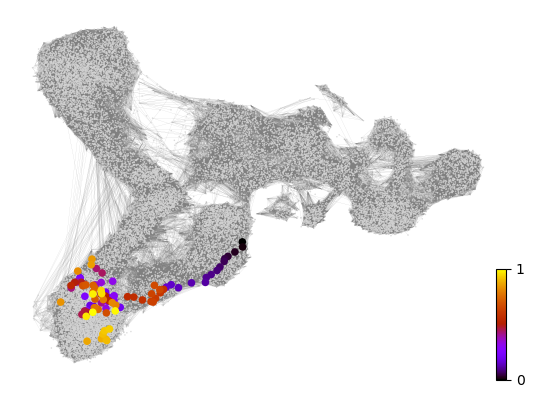

In [93]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=20000)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

### Velocity Pseudotime

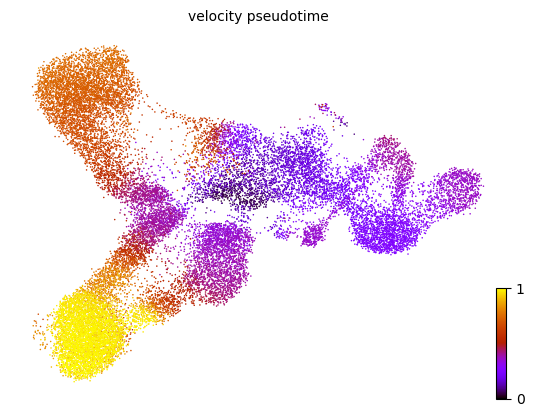

In [94]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

### PAGA velocity graph 

- scv.tl.paga() has a bug: https://github.com/theislab/scvelo/issues/1241

## Stochastic Velocity 

computing velocity embedding
    finished (0:00:08) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


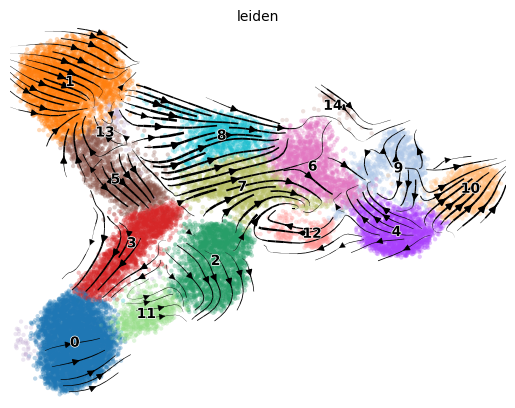

In [95]:
scv.pl.velocity_embedding_stream(adata_dict['adata_gut_stochastic'], basis='umap', color='leiden')

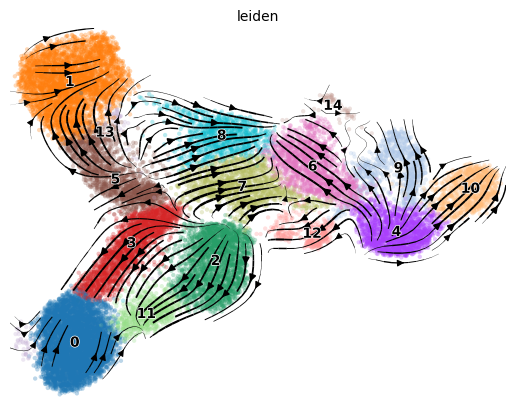

In [96]:
scv.pl.velocity_embedding_stream(adata_dict['adata_gut_dynamical'], basis='umap', color='leiden')

In [ ]:
adata_filtered = adata[adata.obs['cell_type'].isin(clusters_of_interest)]